# Pregunta 3

In [1]:
%pip install opencv-python matplotlib numpy
import cv2
import numpy as np
import matplotlib.pyplot as plt

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


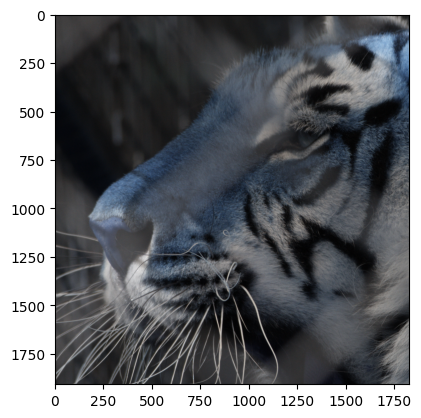

In [2]:
#Primero cargo la imágen para asegurarme que todo esté bien
imagen = cv2.imread('P3_IMG_2387_crop.tif')
imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
#Ploteo la imágen directamente pero no se ven los colores
plt.imshow(imagen)


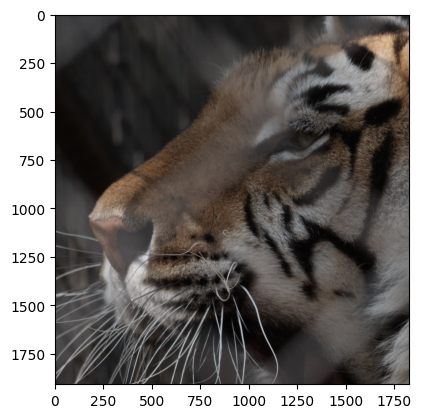

In [3]:
#así que acá la imagen con colores 
plt.imshow(imagen_rgb)

## Vecino más cercano


In [4]:
def vecinomascercano(img, s):
    if img.ndim == 2: #reviso el numero de dimensiones, si es blanco y negro tendrá 2
        alto, ancho = img.shape
    else:
        alto, ancho, rgb = img.shape #cuando es una imagen a color se le agrega el canal de los colores
    #acá defino las nuevas dimensiones de las imagenes, que sera su alto y ancho anterior escalados por el factor s
    altofinal = int(round(alto * s))
    anchofinal = int(round(ancho * s))
    if img.ndim == 2:#acá de nuevo reviso el numero de dimensiones para crear el lienzo vacío
        salida = np.zeros((altofinal, anchofinal), dtype=img.dtype)
    else:
        salida = np.zeros((altofinal, anchofinal, rgb), dtype=img.dtype)
    # ahora se arma la imágen final recorriendo todos los pixeles
    for i in range(altofinal):
        for j in range(anchofinal):
            # coordenada correspondiente en la imagen original
            #ACÁ SE RELACIONAN AMBOS SISTEMAS DE COORDNADAS
            y = i/s
            x = j/s
            # e l redondeo propio del vecino mas cercano
            yvecino = int(round(y))
            xvecino = int(round(x))
            # para evitar IndexError: index out of bounds cuando reviso los bordes de la imágen
            if yvecino > alto - 1:
                yvecino = alto - 1
            if xvecino > ancho - 1:
                xvecino = ancho - 1
            #copiar el valor del píxel más cercano
            salida[i, j] = img[yvecino, xvecino]

    return salida

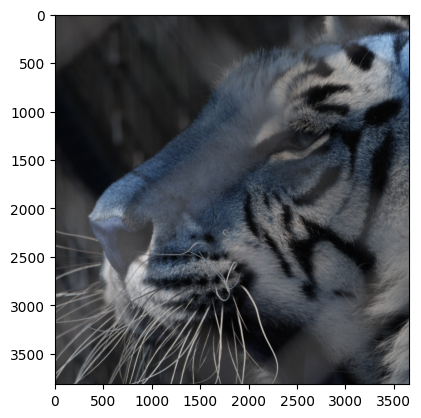

In [6]:
#ahora probaré que funcione en blanco y negro
imagen_reescalada = vecinomascercano(imagen, 2)
plt.imshow(imagen_reescalada)

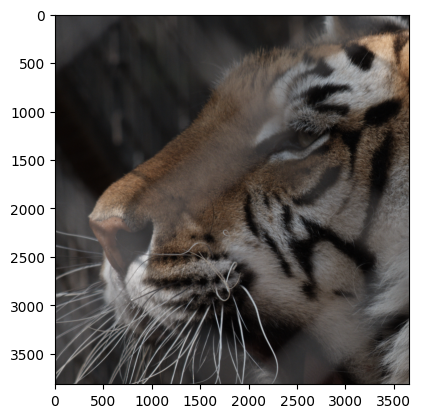

In [ ]:
#Y ahora reviso la imágen a color
imagen_reescalada_color = vecinomascercano(imagen_rgb, 2)
plt.imshow(imagen_reescalada_color)

## Interpolación Bilineal

In [5]:
def bilineal(img, s):
    #esta parte es igual a la de el vecino más cercano
    if img.ndim == 2:
        alto, ancho = img.shape
    else:
        alto, ancho, rgb = img.shape

    altofinal = int(round(alto * s))
    anchofinal = int(round(ancho * s))

    typeimg = img.dtype  # se guarda el tipo para ponerlo en la salida

    if img.ndim == 2:
        salida = np.zeros((altofinal, anchofinal), dtype=np.float64) 
    else:
        salida = np.zeros((altofinal, anchofinal, rgb), dtype=np.float64)

    #es importante pasar los datos a float para las operaciones que se hacen ya que pueden dar valores 
    #negativos y se pierde la precisión
    imgfloat = img.astype(np.float64)  
    
    for i in range(altofinal):
        for j in range(anchofinal):

            #Se define de esa manera para esacalar y evitar errores de Index
            #ACÁ SE RELACIONAN AMBOS SISTEMAS DE COORDNADAS
            y = min(i / s, alto - 1)
            x = min(j / s, ancho - 1)

            #a partir de lo visto en las diapositivas se define lo siguiente
            x1, y1 = int(np.floor(x)), int(np.floor(y))
            #acá nuevamente se coloca la funcion min para que en los bordes no tenga problemas
            x2, y2 = min(x1 + 1, ancho - 1), min(y1 + 1, alto - 1)
            f11 = imgfloat[y1, x1]  
            f21 = imgfloat[y1, x2] 
            f12 = imgfloat[y2, x1] 
            f22 = imgfloat[y2, x2]  
            #interpolar en x, para la fila y1
            if x2 != x1:
                fy1 = f11 + (f21 - f11) / (x2 - x1) * (x - x1)
            else:
                fy1 = f11
            # interpolar en x, para la fila y2
            if x2 != x1:
                fy2 = f12 + (f22 - f12) / (x2 - x1) * (x - x1)
            else:
                fy2 = f12
            #interpolar en y, entre fy1 y fy2
            if y2 != y1:
                valor = fy1 + (fy2 - fy1) / (y2 - y1) * (y - y1)
            else:
                valor = fy1

            salida[i, j] = valor

    salida = np.clip(salida, 0, 255)  #se clipea por si sobrepasa el límite de 255
    return salida.astype(typeimg)  #para una correcta visualización se devuelve al formato inicial

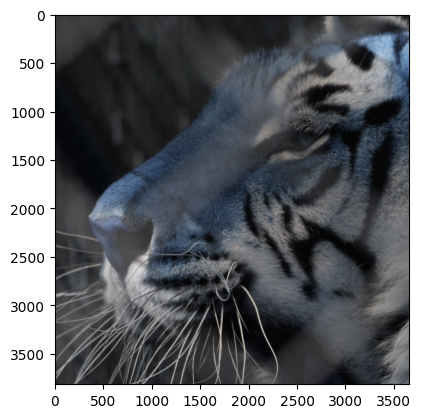

In [29]:
#ahora probaré que funcione en blanco y negro
imagen_reescalada = bilineal(imagen, 2)
plt.imshow(imagen_reescalada)

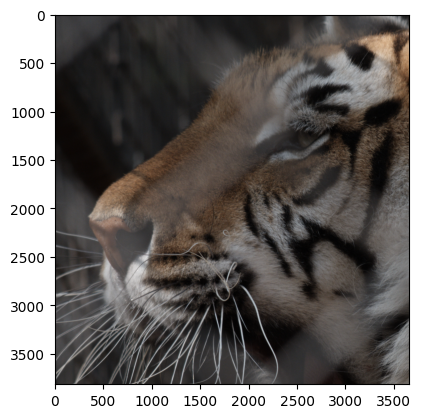

In [28]:
imagen_reescalada_color = bilineal(imagen_rgb, 2)
plt.imshow(imagen_reescalada_color)

## Experimentación y análisis

Ahora importaré una segunda foto para poder hacer las comparaciones, ya que esta presenta lineas y bordes fuertes



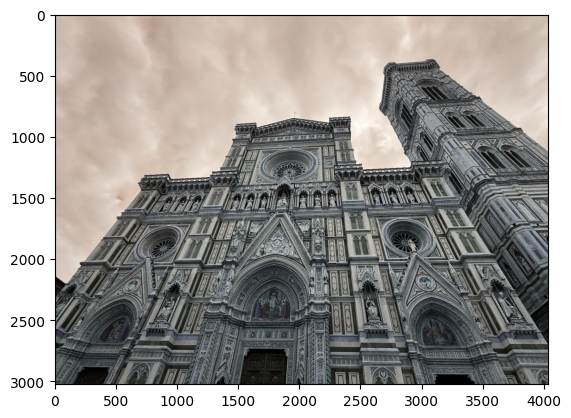

In [8]:
#Primero cargo la imágen para asegurarme que todo esté bien
imagen2 = cv2.imread('IMG_2649.tif')
imagen2_rgb = cv2.cvtColor(imagen2, cv2.COLOR_BGR2RGB)
#Ploteo la imágen directamente pero no se ven los colores
plt.imshow(imagen2)

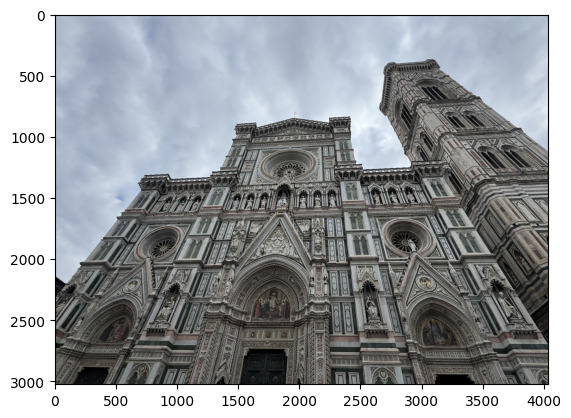

In [9]:
#así que acá la imagen con colores 
plt.imshow(imagen2_rgb)

Los factores con los que trabajaré son 0,5 0,75 1,5 y 2

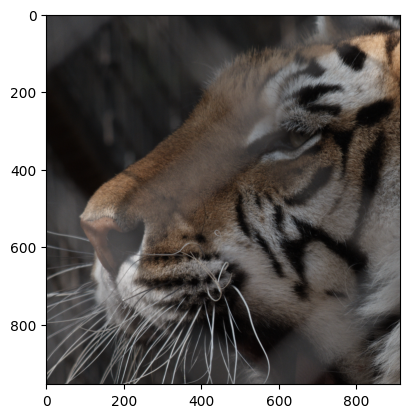

In [13]:
#0,5
imagen_05_ve= vecinomascercano(imagen_rgb, 0.5)
plt.imshow(imagen_05_ve)

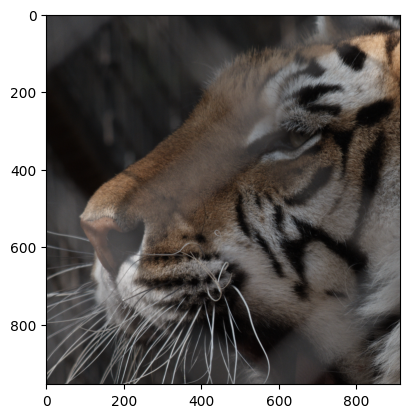

In [14]:
#0,5
imagen_05_bi= bilineal(imagen_rgb, 0.5)
plt.imshow(imagen_05_bi)

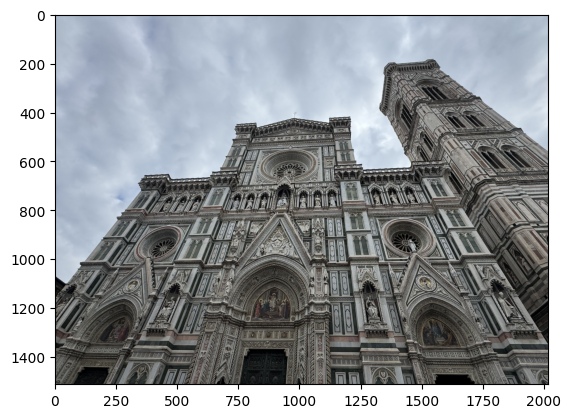

In [15]:
#0,5
imagen2_05_ve= vecinomascercano(imagen2_rgb, 0.5)
plt.imshow(imagen2_05_ve)

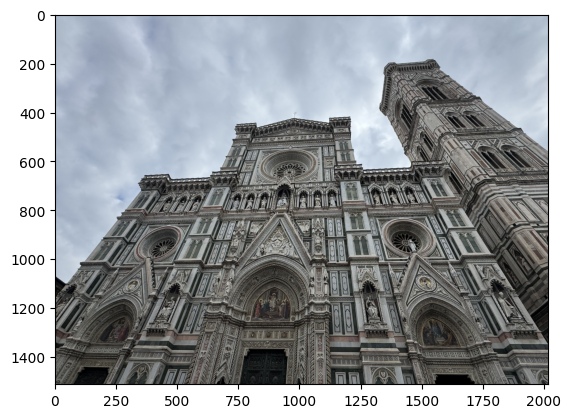

In [16]:
#0,5
imagen2_05_bi= bilineal(imagen2_rgb, 0.5)
plt.imshow(imagen2_05_bi)

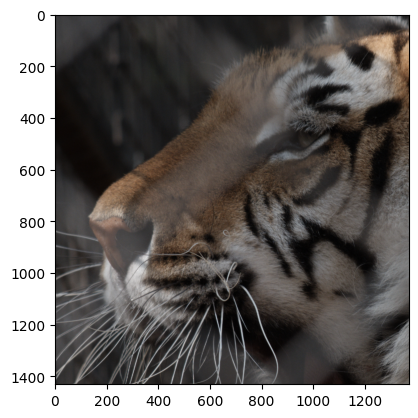

In [17]:
#0,75
imagen_075_ve= vecinomascercano(imagen_rgb, 0.75)
plt.imshow(imagen_075_ve)

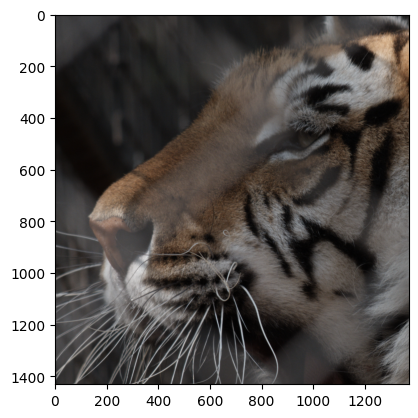

In [18]:
#0,75
imagen_075_bi= bilineal(imagen_rgb, 0.75)
plt.imshow(imagen_075_bi)

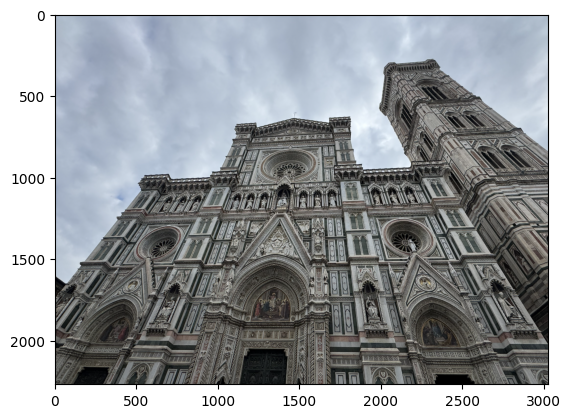

In [19]:
#0,75
imagen2_075_ve= vecinomascercano(imagen2_rgb, 0.75)
plt.imshow(imagen2_075_ve)

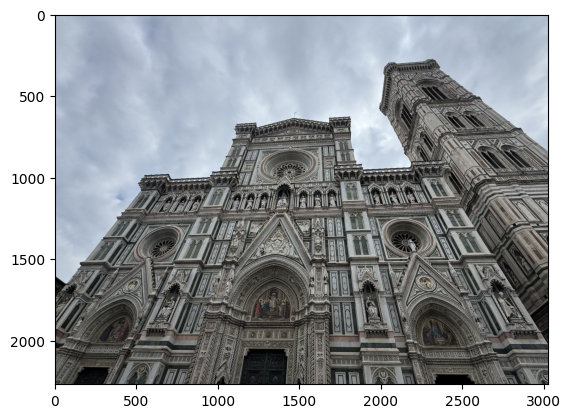

In [20]:
#0,75
imagen2_075_bi= bilineal(imagen2_rgb, 0.75)
plt.imshow(imagen2_075_bi)

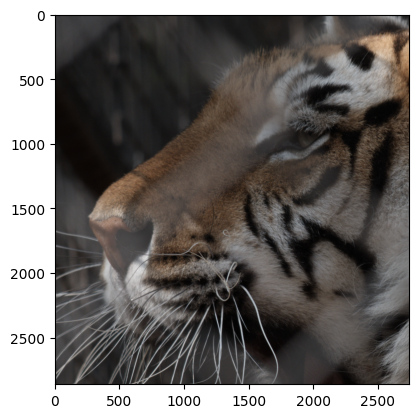

In [ ]:
#1,5
imagen_15_ve= vecinomascercano(imagen_rgb, 1.5)
plt.imshow(imagen_15_ve)

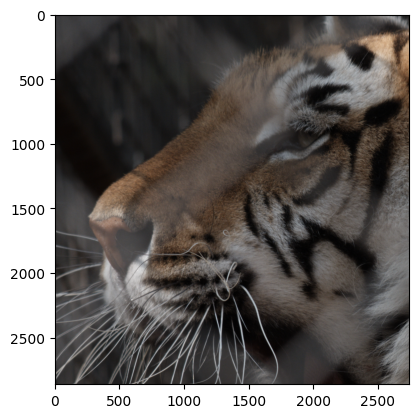

In [22]:
#1,5
imagen_15_bi= bilineal(imagen_rgb, 1.5)
plt.imshow(imagen_15_bi)

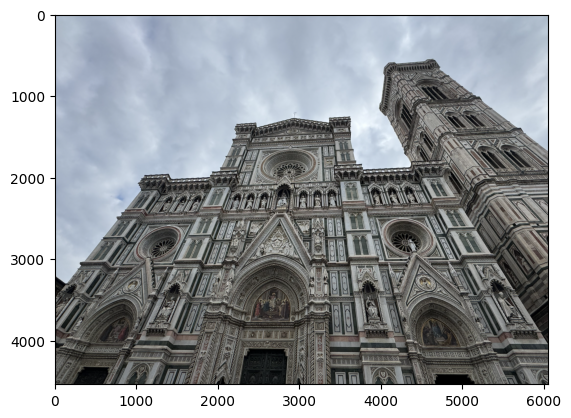

In [23]:
#1,5
imagen2_15_ve= vecinomascercano(imagen2_rgb, 1.5)
plt.imshow(imagen2_15_ve)

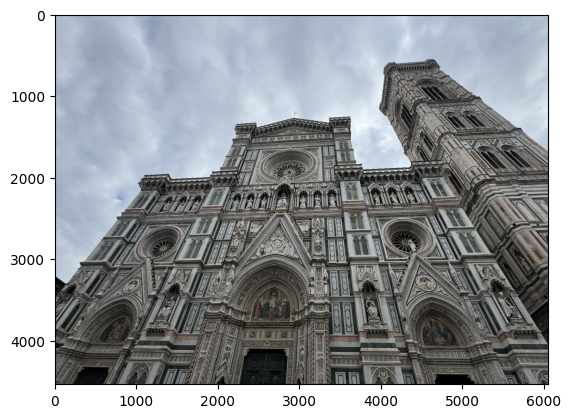

In [ ]:
#1,5
imagen2_15_bi= bilineal(imagen2_rgb, 1.5)
plt.imshow(imagen2_15_bi)

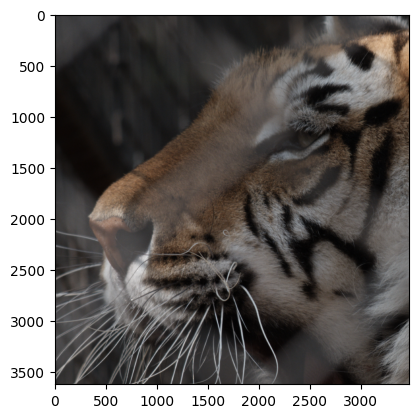

In [6]:
#2
imagen_2_ve= vecinomascercano(imagen_rgb, 1.9)
plt.imshow(imagen_2_ve)

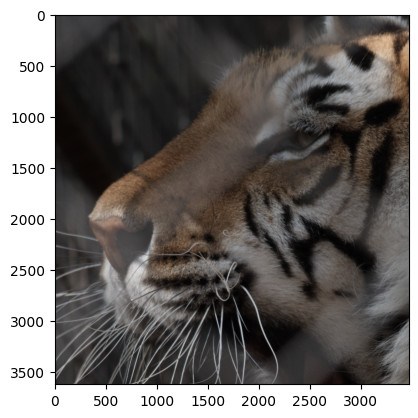

In [10]:
#2
imagen_2_bi= bilineal(imagen_rgb, 1.9)
plt.imshow(imagen_2_bi)

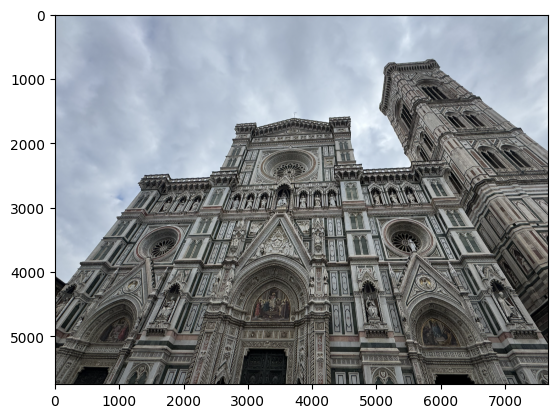

In [11]:
#2
imagen2_2_ve= vecinomascercano(imagen2_rgb, 1.9)
plt.imshow(imagen2_2_ve)

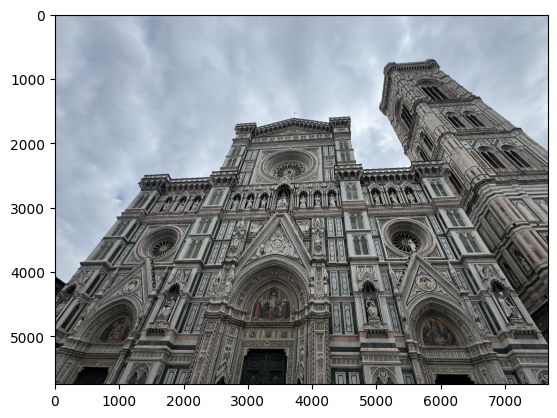

In [12]:
#2
imagen2_2_bi= bilineal(imagen2_rgb, 1.9)
plt.imshow(imagen2_2_bi)

Esto es para el punto 5, de hacer la reducción seguida de una ampliación

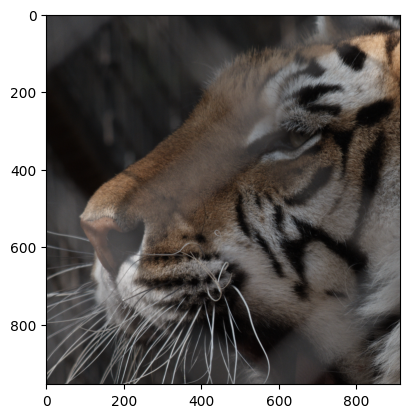

In [29]:
#0,5
imagen_05_ve= vecinomascercano(imagen_rgb, 0.5)
plt.imshow(imagen_05_ve)

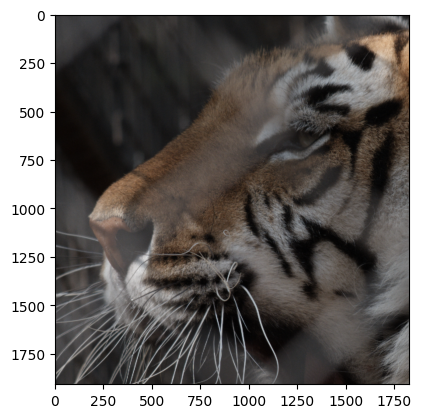

In [30]:
#2
reampliada= vecinomascercano(imagen_05_ve, 2)
plt.imshow(reampliada)

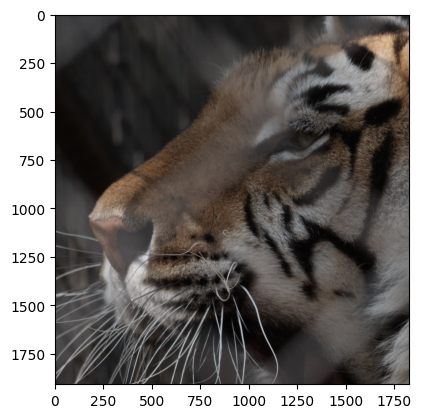

In [31]:
plt.imshow(imagen_rgb)

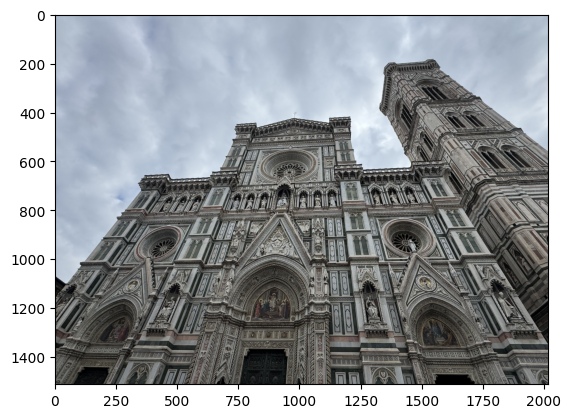

In [32]:
#0,5
imagen2_05_ve= vecinomascercano(imagen2_rgb, 0.5)
plt.imshow(imagen2_05_ve)

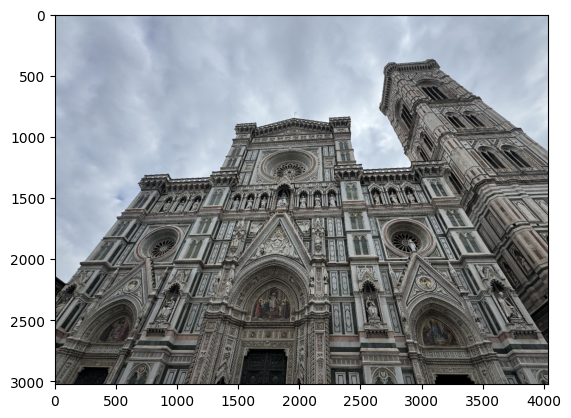

In [33]:
#2
reampliada2= vecinomascercano(imagen2_05_ve, 2)
plt.imshow(reampliada2)

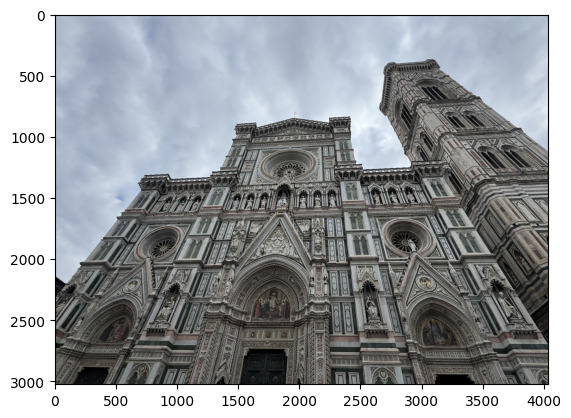

In [34]:
plt.imshow(imagen2_rgb)

Este es para el punto 6, sobre hacer varios reescalados sucesivos


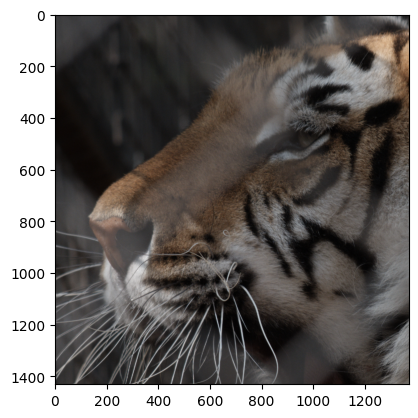

In [41]:
img_reescalada1= vecinomascercano(imagen_rgb, 0.75)
plt.imshow(img_reescalada1)

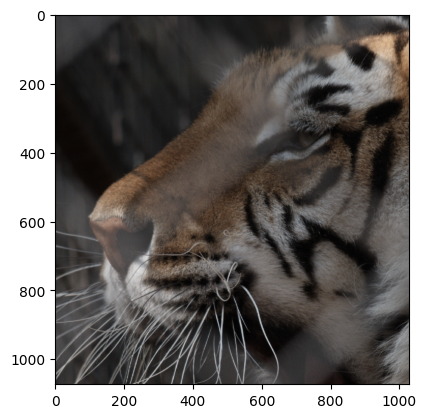

In [36]:
img_reescalada2= vecinomascercano(img_reescalada1, 0.75)
plt.imshow(img_reescalada2)

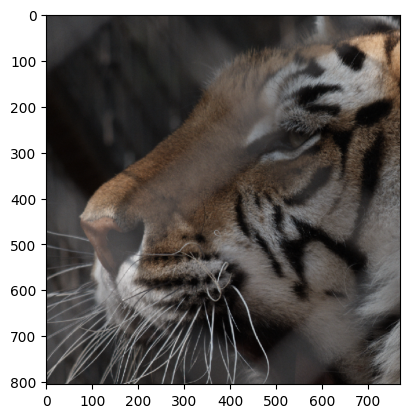

In [37]:
img_reescalada3= vecinomascercano(img_reescalada2, 0.75)
plt.imshow(img_reescalada3)

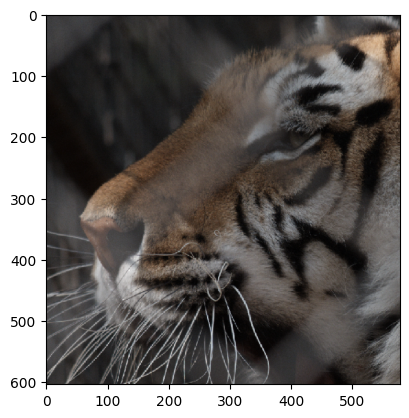

In [38]:
img_reescalada4= vecinomascercano(img_reescalada3, 0.75)
plt.imshow(img_reescalada4)

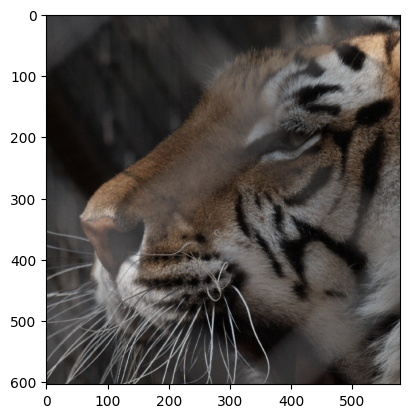

In [40]:
img_reescalada_directa= vecinomascercano(imagen_rgb, 0.3164)
plt.imshow(img_reescalada_directa)

Para el punto 8 veré que pasa con la imágen al escalarla mucho o muy poco

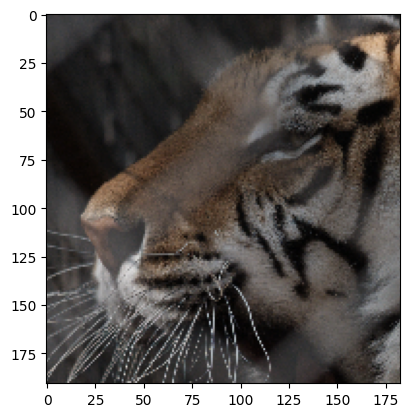

In [42]:
img_muy_chica= vecinomascercano(imagen_rgb, 0.1)
plt.imshow(img_muy_chica)

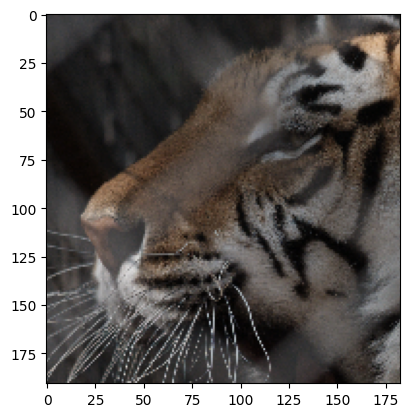

In [43]:
img_muy_chica_bi= bilineal(imagen_rgb, 0.1)
plt.imshow(img_muy_chica_bi)

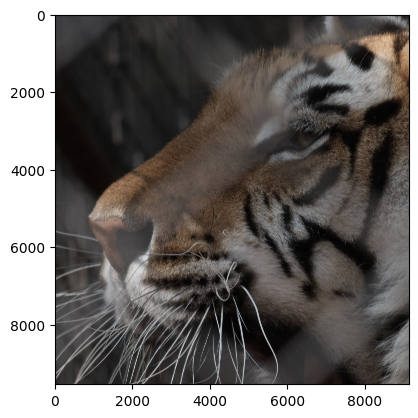

In [ ]:
img_muy_grande= vecinomascercano(imagen_rgb, 3)
plt.imshow(img_muy_grande)

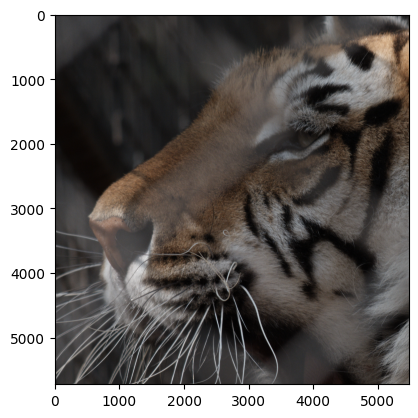

In [46]:
img_muy_grande_bi= bilineal(imagen_rgb, 3)
plt.imshow(img_muy_grande_bi)